# Investigations into scans and nodules to support nodule detection model exploration

In [5]:
import json
import re
import matplotlib.pyplot as plt
import os
import pandas as pd
from pathlib import Path
import random
import warnings
import SimpleITK as sitk
import sys
from tempfile import TemporaryDirectory
from time import strftime
import xnat
from zipfile import ZipFile
from collections import namedtuple
import numpy as np
import matplotlib.patches as patches
from typing import List

sys.path.append('../')
sys.path.append('/Users/john/DELETE/DSH/Code/SummitSystemDataExtraction')

from utilities.utils import *
#from summit.doc import MDPair
from sys_config import config

warnings.filterwarnings('ignore')

PROJECT_NAME = 'ScansAndNodules'
RUN_NAME = '23-Jun-12'
DATA_PATH = os.path.join(config['project_data'], PROJECT_NAME, RUN_NAME)

# Scans investigations

- Background
    - Which scans are saved to cs cluster changes constantly so this is a snapshot taken on 23rd June 2023 and will form basis for investigations

</br>

- Objective
    - Understand what proportion have nodules
    - Check the distribution of management plans (though really this needs to be at the nodule level)


In [60]:
"""

Load the saved scans into a dataframe. They are natively in long format so in order to merge with ppt level
data it is necessary to flatten out

"""

def get_studyid(s):
    try:
        return s.split('_',1)[0]
    except:
        return ''
    
def get_tp(s):
    recode = {
        'Y0_BASELINE_A' : 'Saved_Y0',        
        'Y0_NODULE_FOLLOWUP_3M' : 'Saved_Y0_3M',     
        'Y0_NODULE_FOLLOWUP_6M' : 'Saved_Y0_6M',
        'Y1_ALWAYS_SCAN_A' : 'Saved_Y1',
        'Y1_NODULE_FOLLOWUP_3M' : 'Saved_Y1_3M',  
        'Y1_NODULE_FOLLOWUP_6M' : 'Saved_Y1_6M',
        'Y1_RANDOMISATION' : 'Saved_Y1',
        'Y2' : 'Saved_Y2', 
        'Y2_NODULE_FOLLOWUP_3M' : 'Saved_Y2_3M'
    }

    try:
        return recode[s.split('_',1)[1]]
    except:
        print('error',str(s))
        return ''

lung_saved = (
                    pd.read_csv('/Users/john/DELETE/DSH/Projects/ScansMapping/Src/cs/summit_lung50_scans_saved.txt',header=None)
                    .rename(columns={0:'ScanId'})
                    .assign(StudyId=lambda df: df.ScanId.apply(get_studyid))
                    .assign(TimePoint=lambda df: df.ScanId.apply(get_tp))

)
lung_saved_flat = pd.crosstab(lung_saved.StudyId, lung_saved.TimePoint)
display(lung_saved_flat.head())



TimePoint,Saved_Y0,Saved_Y0_3M,Saved_Y0_6M,Saved_Y1,Saved_Y1_3M,Saved_Y1_6M,Saved_Y2,Saved_Y2_3M
StudyId,,,,,,,,
summit-2222-djr,1,1,0,1,0,0,0,0
summit-2223-ypu,0,0,0,1,0,0,0,0
summit-2223-yts,1,0,0,1,0,0,0,0
summit-2224-eju,1,0,0,1,0,0,0,0
summit-2224-gak,1,0,0,1,0,0,1,0


In [45]:
"""

Scan data was produced by the SUMMIT engine. The scan data holds all timepoints flattened out
but we only need the baseline data at this stage, so the baseline variables inc. Saved flag are
pulled out of the MDPair object and then we just work with the csv data

"""
scans = MDPair('scans')
scans.load(Path(DATA_PATH,'Scans').as_posix(),delim=',')
scans.data.head()

prefixes = ['','y0_3m_','y0_6m_','y1_','y1_3m_','y1_6m_','y2_','y2_3m_']
suffixes = ['y0','y0_3m','y0_6m','y1','y1_3m','y1_6m','y2','y2_3m']

scan_data = scans.data.merge(lung_saved_flat,
                              how='left',
                              left_on='LDCT_RADIOLOGY_REPORT_main_participant_id',
                              right_on='StudyId')
baseline_variables = [
    col
    for col in scan_data.columns
    if re.search(r'^' + prefixes[0] + r'(ldct|radiology)',col, re.IGNORECASE) or \
    re.search(suffixes[0] + r'$', col, re.IGNORECASE) or \
    re.search('CohortId', col, re.IGNORECASE)
]

baseline_scan_data = scan_data[baseline_variables]
baseline_scan_data[['Saved_Y0']] = baseline_scan_data[['Saved_Y0']].fillna(0).astype(int)

# The long default variable names produced by the SUMMIT engine will be simplified as we are working with
# a single timepoint and there is no risk of conflict.
rename_dict = {
    col : (
            col.replace('LDCT_RADIOLOGY_REPORT_main_','')
            .replace('radiology_report_','')
            .replace('mpi_Participant_','')
            .replace('mpi_RadiologyAlgorithmValidationReport_','')
    )
    for col in baseline_scan_data.columns
}

baseline_scan_data.rename(columns=rename_dict, inplace=True)
display(baseline_scan_data.head())

# display the column names for easy reference
for col in baseline_scan_data.columns:
    print(col)

,form_instance_id,form_instance_status,participant_id,incidental_coronary_calcium_cir,incidental_coronary_calcium_lmlad,incidental_coronary_calcium_rca,incidental_family_history_of_lung_cancer,incidental_mediastinal,incidental_mediastinal_enum_anterior_mediastinal_mass,incidental_mediastinal_enum_aortic_valve_calcification,...,metadata_timepoint,nodule_present,created_time,completed_time,last_form_edit_time,CohortId,SubmittedDate_Y0,ProcedureType_Y0,ChosenManagementPlan_Y0,Saved_Y0
0,yGaZ-aYjsvx1ElSOfQ5o_DGQnArqs1vqqUKuyO6NZDE,COMPLETED,summit-2222-djr,NONE,NONE,NONE,NOT_ANSWERED,NONE,False,False,...,Y0,YES,2019-10-10 13:49:33,2019-10-10T13:49:33Z,2019-10-10 13:49:33,268-VTS,2019-10-10 13:49:33,Y0,3_MONTH_FOLLOW_UP_SCAN,1
1,EGRJ945atCAaxP_RkspELNfzyrSAQlWCSLqhOTHzBYg,COMPLETED,summit-2222-zmd,MILD,NONE,MILD,NOT_ANSWERED,NONE,False,False,...,Y0,YES,2019-10-23 06:08:11,2019-10-23T06:08:11Z,2019-10-23 06:08:11,377-YCY,2019-10-23 06:08:11,Y0,RANDOMISATION_AT_YEAR_1,0
2,SEo0oLfS3K7NzN9imjFCe9VtLxMMaD5Jv5mVyg8zhok,COMPLETED,summit-2223-rvs,NONE,MODERATE,NONE,NOT_ANSWERED,NONE,False,False,...,Y0,NO,2021-04-14 14:51:25,2021-04-14T14:51:25Z,2021-04-14 14:51:25,989-HWN,2021-04-14 14:51:25,Y0,RANDOMISATION_AT_YEAR_1,0
3,lKjulp8afqucvWQTNakDTz5shUi1haw357wiUvKQc5E,COMPLETED,summit-2223-sbv,MODERATE,SEVERE,SEVERE,NOT_ANSWERED,AORTIC_VALVE_CALCIFICATION,False,True,...,Y0,YES,2019-08-21 06:23:18,2019-08-21T06:23:18Z,2019-08-21 06:23:18,611-GDN,2019-08-21 06:23:18,Y0,3_MONTH_FOLLOW_UP_SCAN,0
4,MWJnb_rVHMkRGvaivlt70wsqXPmNImMPwJh0iA7-kr8,COMPLETED,summit-2223-vaw,NONE,MILD,MILD,YES,NONE,False,False,...,Y0,NO,2019-10-21 06:19:46,2019-10-21T06:19:46Z,2019-10-21 06:19:46,938-MRD,2019-10-21 06:19:46,Y0,RANDOMISATION_AT_YEAR_1,0


form_instance_id
form_instance_status
participant_id
incidental_coronary_calcium_cir
incidental_coronary_calcium_lmlad
incidental_coronary_calcium_rca
incidental_family_history_of_lung_cancer
incidental_mediastinal
incidental_mediastinal_enum_anterior_mediastinal_mass
incidental_mediastinal_enum_aortic_valve_calcification
incidental_mediastinal_enum_none
incidental_mediastinal_enum_thoracic_aortic_dilatation
incidental_mediastinal_enum_thyroid_nodule
incidental_mediastinal_anterior_mass
incidental_mediastinal_aortic_calcification
incidental_mediastinal_malignant_thyroid_nodule
incidental_mediastinal_thoracic_aortic_dilatation
incidental_other_suspicious_emergency_findings
incidental_other_suspicious_emergency_findings_describe
incidental_overall_lung_rads
incidental_pulmonary
incidental_pulmonary_enum_bronchiectasis
incidental_pulmonary_enum_diffuse_pleural_thickening
incidental_pulmonary_enum_interstitial_lung_disease
incidental_pulmonary_enum_none
incidental_pulmonary_enum_pleural_ef

In [61]:
display('Check how many scans have been saved to cs cluster (0-Not saved, 1-Saved)')
display(baseline_scan_data.Saved_Y0.value_counts())

'Check how many scans have been saved to cs cluster (0-Not saved, 1-Saved)'

0    6932
1    6029
Name: Saved_Y0, dtype: int64

In [62]:
"""
utility fns

- get_column_name
- crosstab_with_perc

"""

def crosstab_with_perc(df, row, col, to_csv=None):
    """
    Combines abs and percentages in a table, optionally saves to csv
    """
    x1 = pd.crosstab(
        [                
            df[row]
        ], 
        [
            df[col]
        ], margins=True
    )
    cnt = len(x1.columns)
    x2 = pd.crosstab(
        [                
            df[row]
        ], 
        [
            df[col]
        ], margins=True, normalize=True
    )

    x3 = x1.merge(x2,
                  left_index=True,
                  how='left',
                  right_index=True,
                  suffixes=['',' (%)']).iloc[:, [j*cnt + i for i in range(cnt) for j in [0,1]]]
    
    display(x3)

    if to_csv:
        x3.to_csv(f'../output/analysis/{to_csv}.csv')

def value_counts_with_perc(df, var, to_csv=None):
    x1 = pd.DataFrame(df[var].value_counts())
    x2 = pd.DataFrame(df[var].value_counts(normalize=True))
    x3 = x1.merge(x2,left_index=True, right_index=True)

    display(x3)
    if to_csv:
        x3.to_csv(f'../output/analysis/{to_csv}.csv')

In [63]:
"""
Run analysis on the number of scans with nodules and also associated management plans

NOTE: filter down to just the scans saved before running analysis

"""

baseline_scans_saved = baseline_scan_data[baseline_scan_data['Saved_Y0']==1]


crosstab_with_perc(df=baseline_scans_saved,
                   row='nodule_present',
                   col='Saved_Y0',
                   to_csv='nodule_present_x_saved')

baseline_scans_with_nodule = baseline_scans_saved[baseline_scans_saved['nodule_present']=='YES']
crosstab_with_perc(df=baseline_scans_with_nodule,
                   row='ChosenManagementPlan_Y0',
                   col='nodule_present',
                   to_csv='management_plan_x_nodule_present')

baseline_scans_no_nodule = baseline_scans_saved[baseline_scans_saved['nodule_present']=='NO']
crosstab_with_perc(df=baseline_scans_no_nodule,
                   row='ChosenManagementPlan_Y0',
                   col='nodule_present',
                   to_csv='management_plan_x_no_nodule_present')


Saved_Y0,1,1 (%),All,All (%)
nodule_present,,,,
NO,2170,0.359927,2170,0.359927
YES,3859,0.640073,3859,0.640073
All,6029,1.000000,6029,1.000000


nodule_present,YES,YES (%),All,All (%)
ChosenManagementPlan_Y0,,,,
3_MONTH_FOLLOW_UP_SCAN,1728,0.447784,1728,0.447784
ALWAYS_SCAN_AT_YEAR_1,92,0.023840,92,0.023840
RANDOMISATION_AT_YEAR_1,1803,0.467219,1803,0.467219
URGENT_REFERRAL,236,0.061156,236,0.061156
All,3859,1.000000,3859,1.000000


nodule_present,NO,NO (%),All,All (%)
ChosenManagementPlan_Y0,,,,
ALWAYS_SCAN_AT_YEAR_1,23,0.010599,23,0.010599
RANDOMISATION_AT_YEAR_1,2132,0.982488,2132,0.982488
URGENT_REFERRAL,15,0.006912,15,0.006912
All,2170,1.000000,2170,1.000000


# Nodules investigations

- Only concerned with:
    - baseline scans
    - scans that are cached to cs cluster

- Objectives
    - From SUMMIT radiology algorithms it is clear that type of nodule drives management plan so check what distribution of nodule types
    - Compare Management plans to nodule type as this could be a factor in the detection (are some nodules types more difficult to pick up)
    - Check for nodules sizes per type (are some types of nodules just bigger than others, again this will play in to things like anchor sizes in detection algorithms)

In [64]:
"""

Nodules data was produced by SUMMIT engine. As with the Scans data, reduce down to jus baseline variables
additionally we need to filter on the Nodule form being COMPLETED as this will include New variables added
and also records that didnt have a nodule. Finally just keep the data that is saved to the cs cluster

"""
nodules = MDPair('nodules')
nodules.load(Path(DATA_PATH,'Nodules').as_posix(),delim=',')
nodules_data = nodules.data.merge(
                lung_saved_flat,
                how='left',
                left_on='LDCT_RADIOLOGY_REPORT_main_participant_id',
                right_on='StudyId')
nodules_data[['Saved_Y0']] = nodules_data[['Saved_Y0']].fillna(0).astype(int)

baseline_nodule_variables = [
    col
    for col in nodules_data.columns
    if re.search(r'^' + prefixes[0] + r'(ldct|radiology)',col, re.IGNORECASE) or \
    re.search(suffixes[0] + r'$', col, re.IGNORECASE) or \
    re.search('CohortId', col, re.IGNORECASE)
]


baseline_nodule_data = nodules_data[baseline_nodule_variables]
rename_dict = {
    col : (
            col.replace('LDCT_RADIOLOGY_REPORT_radiology_report_nodule_brock_score_','')
            .replace('LDCT_RADIOLOGY_REPORT_','')
            .replace('radiology_report_','')
    )
    for col in baseline_nodule_data.columns
}

baseline_nodule_data.rename(columns=rename_dict, inplace=True)
baseline_nodule_data = baseline_nodule_data[baseline_nodule_data['form_instance_status']=='COMPLETED']
baseline_nodule_data_saved = baseline_nodule_data[baseline_nodule_data['Saved_Y0']==1]
display('How many nodules do we have saved?', baseline_nodule_data_saved.shape[0])

# ease of reference
for col in baseline_nodule_data.columns:
    print(col)

'How many nodules do we have saved?'

9952

main_form_instance_id
main_form_instance_status
main_participant_id
main_completed_time
form_instance_status
participant_id
index
nodule_brock_score
nodule_category
nodule_diameter_mm
nodule_lesion_id
nodule_lung_rads
nodule_mass
nodule_mass_core
nodule_mass_double_time_core
nodule_mass_doubling_time
nodule_reliable_segment
nodule_site
nodule_size_volume_cub_mm
nodule_slice_number
nodule_spiculation
nodule_subsolid_major_axis_diameter
nodule_type
nodule_volume_core
nodule_volume_doubling_time
nodule_volume_percentage_change
nodule_volume_volume_double_time_core
nodule_x_coordinate
nodule_y_coordinate
nodule_z_coordinate
Saved_Y0


In [50]:
"""

Key piece of analysis, how many of each type of nodule?

"""

crosstab_with_perc(df=baseline_nodule_data_saved,
                   row='nodule_type',
                   col='Saved_Y0',
                   to_csv='nodule_type_x_saved')

Saved_Y0,1,1 (%),All,All (%)
nodule_type,,,,
CALCIFIED,693,0.069634,693,0.069634
ENDOBRONCHIAL,109,0.010953,109,0.010953
NON_SOLID,439,0.044112,439,0.044112
PART_SOLID,443,0.044514,443,0.044514
PERIFISSURAL,3974,0.399317,3974,0.399317
SOLID,4294,0.431471,4294,0.431471
All,9952,1.000000,9952,1.000000


In [51]:
"""
Next key piece of analysis is the management plans associated with the different nodule types. The management plan
was not saved to the Nodule EDC so needs to be recreated.

The fn: baseline_algorithm replicates the Baseline Radiology Algorithm, this is used to assign the management_plan to each nodule

Then the management plan is analysed filtered by nodule type, separate tables for each of analysis.

"""

class NoduleType:
    SOLID = "SOLID"
    PERIFISSURAL = "PERIFISSURAL"
    NON_SOLID = "NON_SOLID"
    CALCIFIED = "CALCIFIED"
    PART_SOLID = "PART_SOLID"
    ENDOBRONCHIAL = "ENDOBRONCHIAL"

def baseline_algorithm(row):

    nodule_type = str(row['nodule_type'])
    description = str(row['nodule_reliable_segment'])
    volume_mm3 = float(row['nodule_size_volume_cub_mm'])
    malignancy_probability = float(row['nodule_brock_score'])
    major_axis_mm = float(row['nodule_diameter_mm'])
    major_axis_core_mm = float(row['nodule_subsolid_major_axis_diameter'])

    if nodule_type == NoduleType.SOLID:

        if description.lower().startswith('u'):
            if major_axis_mm < 6:
                return 'RANDOMISATION_AT_YEAR_1'

            if major_axis_mm >=6 and major_axis_mm < 8:
                return '3_MONTH_FOLLOW_UP_SCAN'

            if major_axis_mm >= 8 and malignancy_probability < 10:
                return '3_MONTH_FOLLOW_UP_SCAN'

            if major_axis_mm >= 8 and malignancy_probability >= 10:
                return 'URGENT_REFERRAL'

            return 'ERROR-1'

        else:
        
            if volume_mm3 < 80:
                return 'RANDOMISATION_AT_YEAR_1'

            if volume_mm3 >= 80 and volume_mm3 < 300:
                return '3_MONTH_FOLLOW_UP_SCAN'

            if volume_mm3 > 300:
                
                if malignancy_probability < 10:
                    return '3_MONTH_FOLLOW_UP_SCAN'

                if malignancy_probability >= 10:
                    return 'URGENT_REFERRAL'

            return 'ERROR-2'

    if nodule_type == NoduleType.PART_SOLID:

        if major_axis_core_mm < 8:
            return '3_MONTH_FOLLOW_UP_SCAN'

        if major_axis_core_mm >= 8:
            return '3_MONTH_FOLLOW_UP_SCAN'

        return 'ERROR-3'

    if nodule_type == NoduleType.NON_SOLID:
        
        if major_axis_mm < 5:
            return 'RANDOMISATION_AT_YEAR_1'

        if major_axis_mm >= 5:
            return 'ALWAYS_SCAN_AT_YEAR_1'

        return 'ERROR'

    if nodule_type == NoduleType.CALCIFIED:
        return '3_MONTH_FOLLOW_UP_SCAN'

    if nodule_type == NoduleType.ENDOBRONCHIAL:
        return '3_MONTH_FOLLOW_UP_SCAN'

    if nodule_type == NoduleType.PERIFISSURAL:
        return 'RANDOMISATION_AT_YEAR_1'

    return 'ERROR-4'

baseline_nodule_data_saved.loc[:, 'management_plan'] = baseline_nodule_data_saved.apply(baseline_algorithm, axis=1)

for nodule_type in baseline_nodule_data_saved['nodule_type'].unique():

    display(nodule_type)
    tmp_df = baseline_nodule_data_saved[baseline_nodule_data_saved['nodule_type']==nodule_type]
    value_counts_with_perc(df=tmp_df,
                           var='management_plan',
                           to_csv=nodule_type + '_vc_management_plan')

'PERIFISSURAL'

,management_plan_x,management_plan_y
RANDOMISATION_AT_YEAR_1,3974,1.0


'SOLID'

,management_plan_x,management_plan_y
RANDOMISATION_AT_YEAR_1,2632,0.612948
3_MONTH_FOLLOW_UP_SCAN,1443,0.336050
URGENT_REFERRAL,219,0.051001


'CALCIFIED'

,management_plan_x,management_plan_y
3_MONTH_FOLLOW_UP_SCAN,693,1.0


'ENDOBRONCHIAL'

,management_plan_x,management_plan_y
3_MONTH_FOLLOW_UP_SCAN,109,1.0


'NON_SOLID'

,management_plan_x,management_plan_y
ALWAYS_SCAN_AT_YEAR_1,406,0.924829
RANDOMISATION_AT_YEAR_1,33,0.075171


'PART_SOLID'

,management_plan_x,management_plan_y
3_MONTH_FOLLOW_UP_SCAN,443,1.0


In [52]:
"""
Need to validate that the attributed nodule level management plan is consistent with what was produced as part of summit.

This can only be done at a scan level. The logic for determining the scan level management plan was to take the most severe
management plan across all nodules. This could be superseded by an emergencey finding outside of lung so some discrepancies
are to be expected.

First get a scan level management plan from the nodules and then compare against the recommeneded management plan from the scan
level data.

"""

def combine(group):

    management_plans = group[group.notnull()]

    if 'URGENT_REFERRAL' in management_plans.tolist():
        return 'URGENT_REFERRAL'
    
    if '3_MONTH_FOLLOW_UP_SCAN' in management_plans.tolist():
        return '3_MONTH_FOLLOW_UP_SCAN'
    
    if 'ALWAYS_SCAN_AT_YEAR_1' in management_plans.tolist():
        return 'ALWAYS_SCAN_AT_YEAR_1'
    
    if 'RANDOMISATION_AT_YEAR_1' in management_plans.tolist():
        return 'RANDOMISATION_AT_YEAR_1'
    

agg_nodule_management_plan = pd.DataFrame(baseline_nodule_data_saved
                   .groupby('main_participant_id')
                   .apply(lambda group: combine(group['management_plan'].astype(str)))
                ).rename(columns={0:'nodule_management_plan'})  

scan_and_nodule_management_plans = baseline_scans_with_nodule.merge(agg_nodule_management_plan,
                                                                    how='outer',
                                                                    left_on='participant_id',
                                                                    right_index=True)[[
                                                                        'CohortId',
                                                                        'participant_id',
                                                                        'ChosenManagementPlan_Y0',
                                                                        'nodule_management_plan'
                                                                    ]]

scan_and_nodule_management_plans = scan_and_nodule_management_plans.assign(DoesNotMatch=lambda df: df.ChosenManagementPlan_Y0 != df.nodule_management_plan)
display('How many instances are there where there is a discrepancy between the two?')
display(scan_and_nodule_management_plans.DoesNotMatch.value_counts())

'How many instances are there where there is a discrepancy between the two?'

False    3763
True       96
Name: DoesNotMatch, dtype: Int64

# Nodule level management plan discrepancies

The 96 cases were manually investigated using the ParticipantManagementResult table. Each case was inspected
and the nodule algorithm outcomes were validated against the ones reproduced and additional management plans
derived from incidental findings were checked. As were upgrades and downgrades.

Conclusion: There was only one management plan that could not be accounted for and this was very early on in
f/w this proved that the nodule level management plan is working consistently with what was run during f/w.

# Nodule Type Inspection

Background

- It is important to understand what each nodule type looks like, high-level features and location within the lung.

Objective

- Identify 10 nodules of each type and inspect them 
- Check distance from centre, produce axial, coronal and sagittal heatmaps to check if they orientate to specific regions

In [53]:
"""

Utility functions for pulling scans from XNAT to a local directory, getting nodule location
and displaying.

- download_from_xnat: pulls a scan off of xnat and saves locall if it does not already exist

"""
import netrc

def save_to_disk(downloaded_file, output_path, scan_id, metaio):
    # unzip to temp directory
    with ZipFile(downloaded_file) as zip_file:
        zip_file.extractall(output_path)

        if metaio:
            # pull out the folder where the dcms live
            dcm_dir = os.path.dirname([dcm_file for dcm_file in Path(output_path).rglob('*.dcm')][0])

            # read in the dicom series
            reader = sitk.ImageSeriesReader()
            file_names = reader.GetGDCMSeriesFileNames(dcm_dir)
            reader.SetFileNames(file_names)
            sitk_image = reader.Execute()

            # write to MetaIO with compression
            writer = sitk.ImageFileWriter()
            writer.SetImageIO('MetaImageIO')
            writer.SetFileName(os.path.join(output_path, scan_id))
            writer.UseCompressionOn()
            writer.Execute(sitk_image)

        os.remove(downloaded_file)

def download_from_xnat(scan_path, study_id, scan_id, metaio, overwrite=False):
    """
    downloads a scan from XNAT; VPN must be running in order to download.

    creds are stored in netrc

    output is a zip file, to be useful must be either unzipped and/or converted
    to a different format

    """
    creds = netrc.netrc()
    remote_machine = 'https://covid19-xnat.cs.ucl.ac.uk'
    auth_tokens = creds.authenticators(remote_machine)
    
    download_path = scan_path / study_id
    download_path.mkdir(exist_ok=True, parents=True)
    download_file = Path(download_path, scan_id+'.zip')
    metaio_file = Path(download_path, scan_id+'.mhd')

    if not Path.exists(metaio_file) or overwrite:
        with xnat.connect(remote_machine, user=auth_tokens[0], password=auth_tokens[2]) as xnat_session:
            xnat_project = xnat_session.projects['summit_lung50']
            xnat_project.experiments[scan_id].download(download_file)
            save_to_disk(download_file, download_path, scan_id, metaio)


In [54]:
"""

Randomly select 5 scans from each nodule type and download them from xnat
save them as metaio, as this is how it is done on the cluster

"""

nodule_samples_5 = baseline_nodule_data_saved.groupby('nodule_type').sample(n=5, random_state=42)

for nodule_type in nodule_samples_5.nodule_type.unique():

    for idx, row in nodule_samples_5[nodule_samples_5.nodule_type == nodule_type].iterrows():
        
        study_id = row['participant_id']
        scan_id = study_id + '_Y0_BASELINE_A'

        download_from_xnat(scan_path=Path('../scans/lung50/'),
                           study_id=row['participant_id'],
                           scan_id=scan_id,
                           metaio=True)

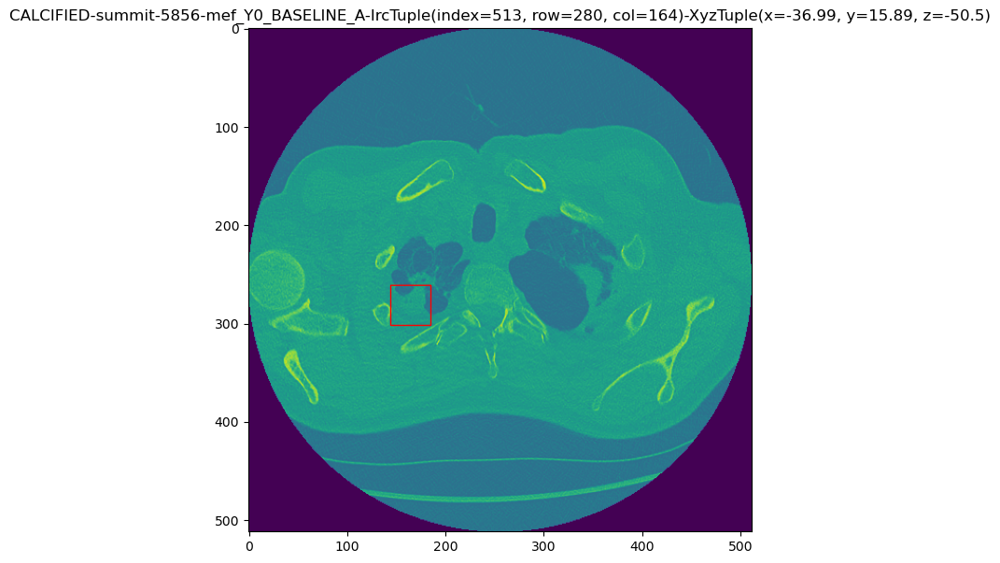

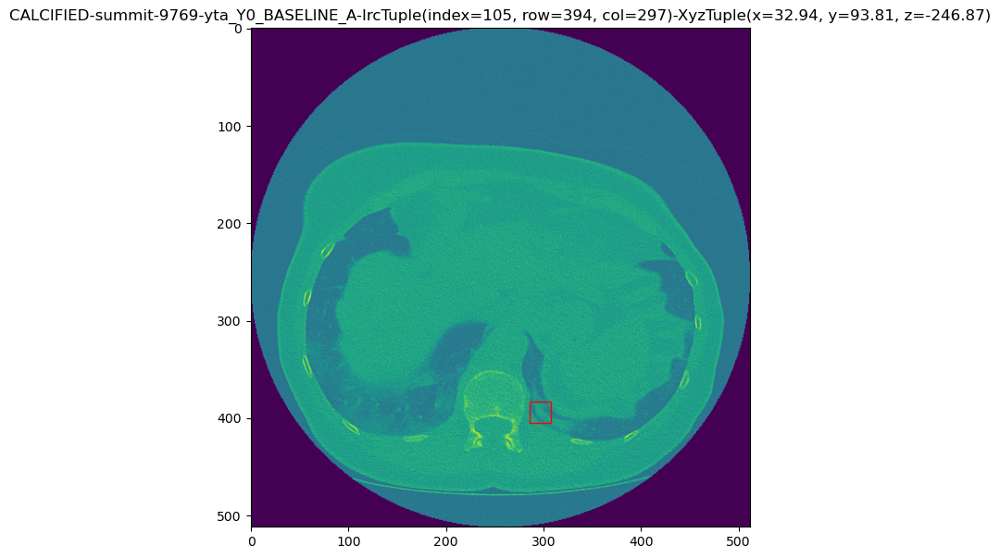

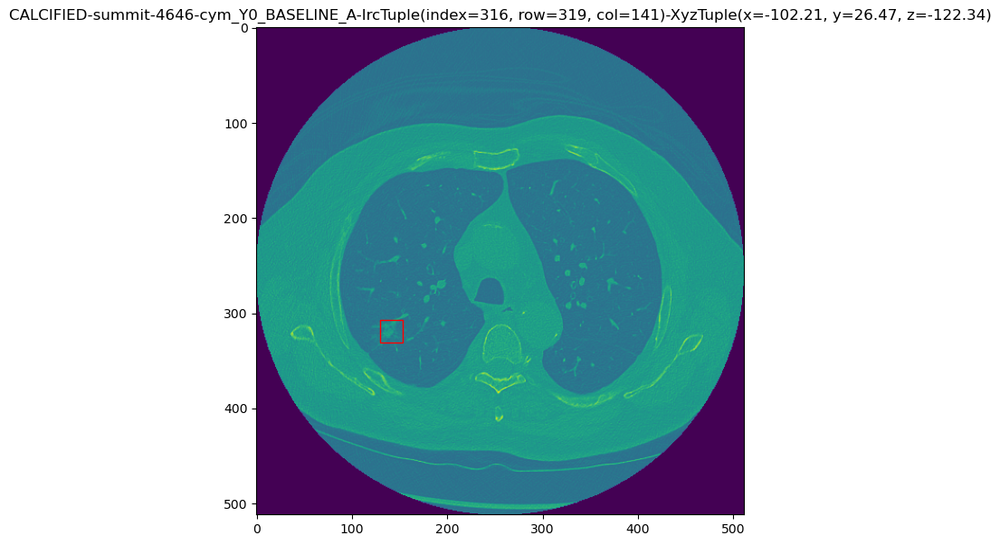

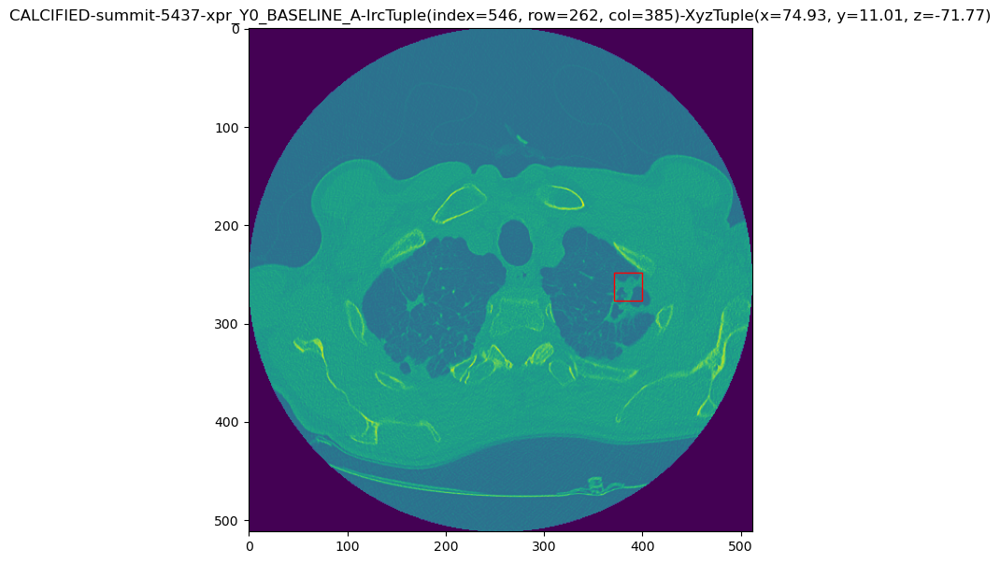

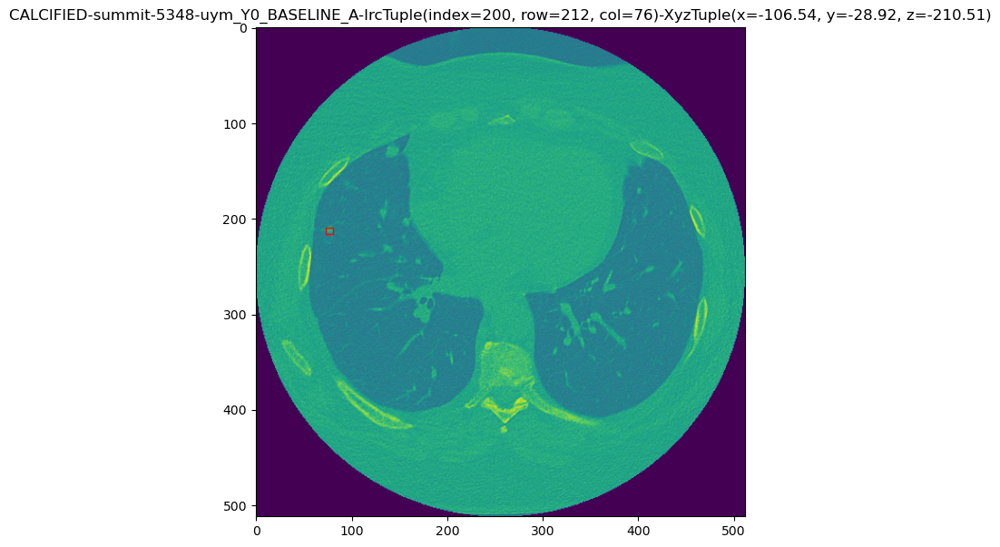

...

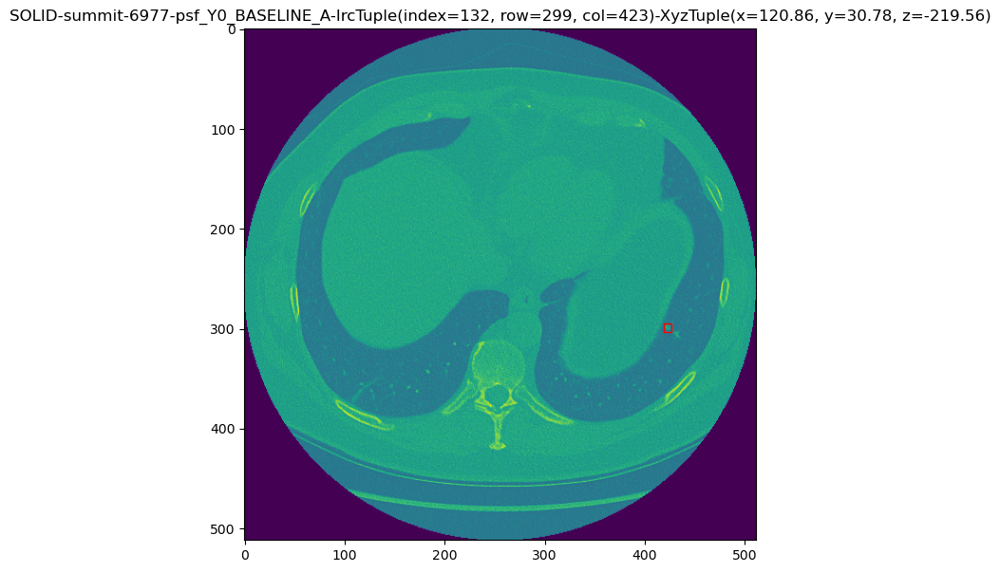

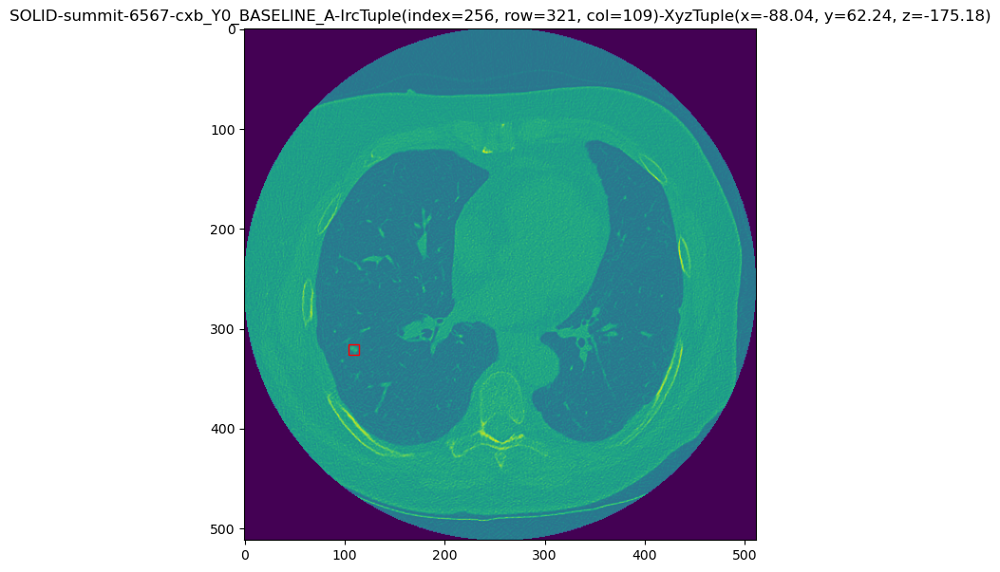

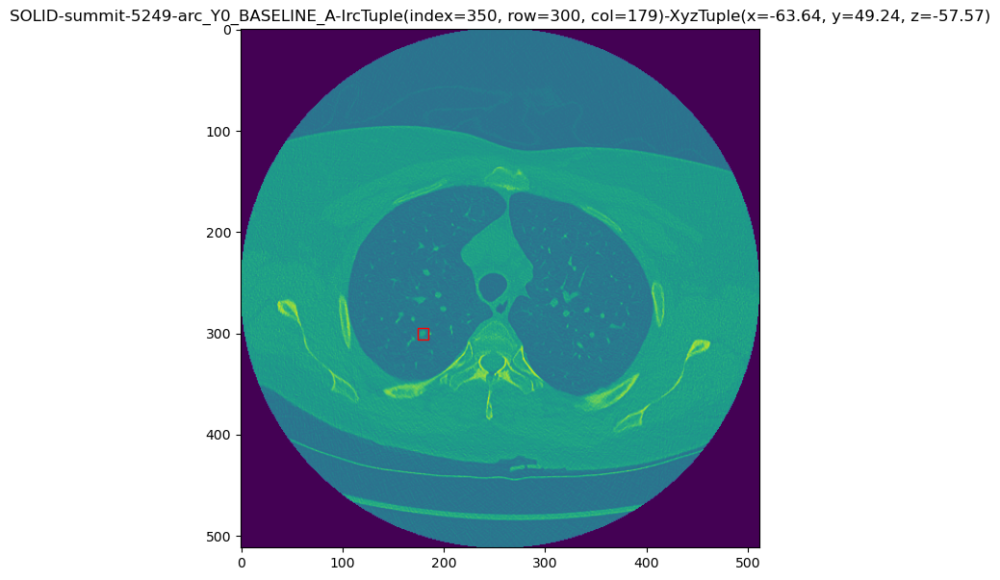

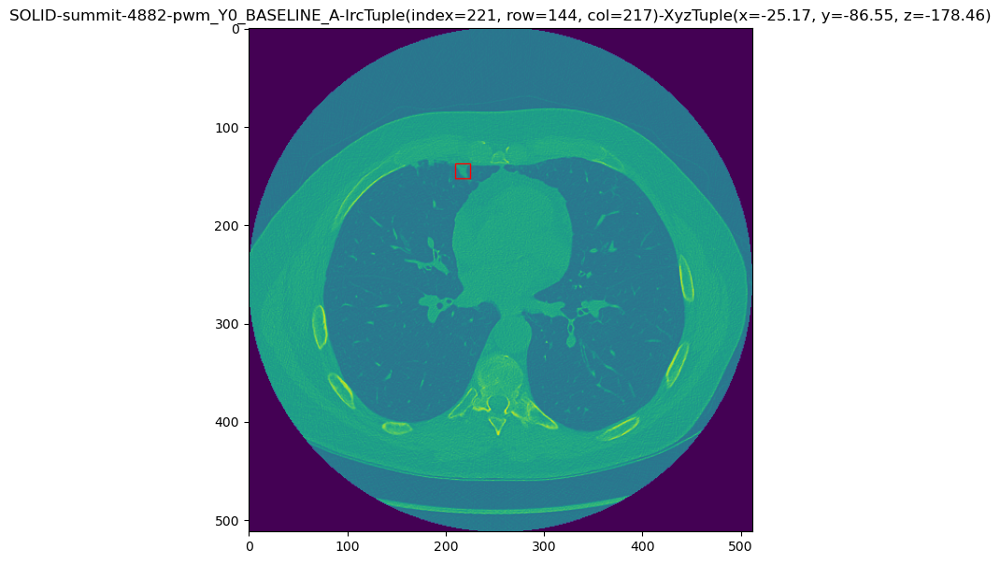

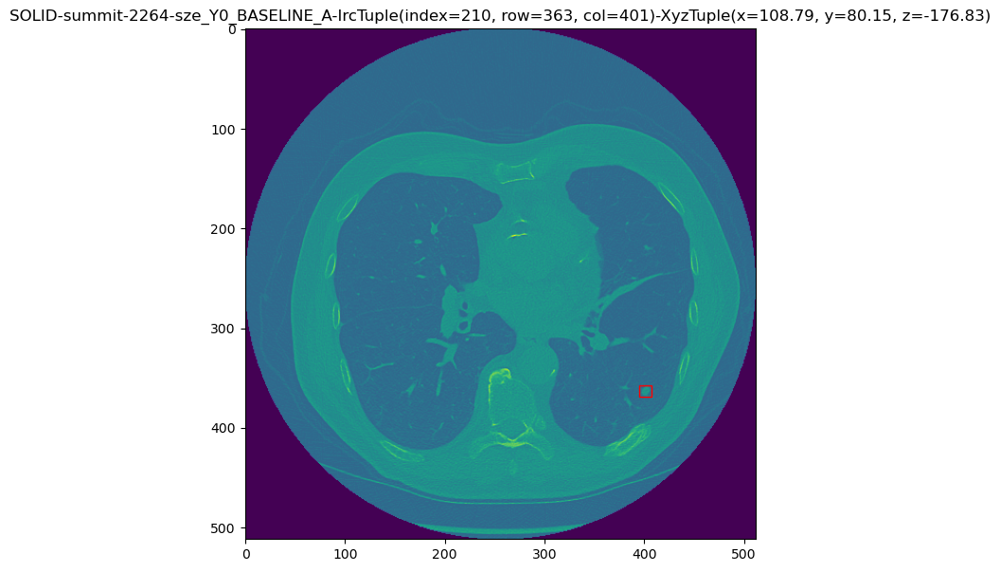

In [55]:

IrcTuple = namedtuple('IrcTuple',['index','row','col'])

XyzTuple = namedtuple('XyzTuple',['x','y','z'])

DisplayTuple = namedtuple('DisplayTuple',['nodule_type','scan_id', 'image', 'xyz_coords', 'irc_coords', 'diameter'])

def display_images(nodule_type_images : List[DisplayTuple]):

    for idx, display_tuple in enumerate(nodule_type_images):
        image = display_tuple.image
        xyz = display_tuple.xyz_coords
        irc = display_tuple.irc_coords
        diameter = display_tuple.diameter

        fig, ax = plt.subplots(nrows=1,ncols=1)
        fig.set_size_inches(7,7)

        ax.imshow(image[irc.index,:,:])
        rect = patches.Rectangle((int(irc.col-((diameter+3)//2)), int(irc.row-((diameter+3)//2))),
                                 width=diameter+3,
                                 height=diameter+3,
                                 linewidth=1,
                                 edgecolor='r',
                                 facecolor='none')
        
        ax.add_patch(rect)
        ax.set_title(display_tuple.nodule_type + '-' + display_tuple.scan_id + '-' + str(irc) + '-' + str(xyz))
        plt.show()

def xyz2irc(coord_xyz, origin, voxel_size, orientation):

    origin_a = np.array(origin)
    voxel_size_a = np.array(voxel_size)
    coord_a = np.array(coord_xyz)

    cri_a = ((coord_a - origin_a) @ np.linalg.inv(orientation)) / voxel_size_a
    
    # it can only be whole numbers as irc
    cri_a = np.round(cri_a)
    return IrcTuple(index=int(cri_a[2]), row=int(cri_a[1]), col=int(cri_a[0]))

def irc2xyz(coord_irc, origin_xyz, vxSize_xyz, direction_a):
    cri_a = np.array(coord_irc)[::-1]
    origin_a = np.array(origin_xyz)
    vxSize_a = np.array(vxSize_xyz)
    coords_xyz = (direction_a @ (cri_a * vxSize_a)) + origin_a
    # coords_xyz = (direction_a @ (idx * vxSize_a)) + origin_a
    return XyzTuple(*coords_xyz)

class SummitScan:
    """
    Author: John McCabe
    Description:  

    Attributes:
        pixel_array
        voxel_size
        origin
        orientation
    """
    def __init__(self, scan_uid, metadata, image) -> None:
        super().__init__()
        self.scan_uid = scan_uid
        self.metadata = metadata
        self.image = image

        # Pull out the salient bits of info needed
        self.origin = self.metadata.GetOrigin()
        self.voxel_size = self.metadata.GetSpacing()
        self.orientation = np.array(self.metadata.GetDirection()).reshape(3,3)

    @classmethod
    def load_scan(cls, path, type='MetaImageIO'):
        """
        Loads the scan from raw. Keeps all properties as part of the slices. 
        """

        # unique identifier can be found from file name
        scan_uid = os.path.basename(path).split('.')[0]

        # read in the scan
        if type == 'MetaImageIO':
            metadata = sitk.ReadImage(path)
            image = np.array(sitk.GetArrayFromImage(metadata), dtype=np.float32)

        return cls(scan_uid, metadata, image)
    
for nodule_type in nodule_samples_5.nodule_type.unique():

    nodule_type_images = []
    for idx, row in nodule_samples_5[nodule_samples_5.nodule_type == nodule_type].iterrows():
        
        study_id = row['participant_id']
        scan_id = study_id + '_Y0_BASELINE_A'
        scan = SummitScan.load_scan(Path('../scans/lung50/', study_id, scan_id+'.mhd').as_posix())

        nodule_xyz = XyzTuple(x=row['nodule_x_coordinate'],
                                y=row['nodule_y_coordinate'],
                                z=row['nodule_z_coordinate'])
        
        nodule_irc = xyz2irc(coord_xyz=nodule_xyz,
                             origin=scan.origin,
                             voxel_size=scan.voxel_size,
                             orientation=scan.orientation)

        
        nodule_diameter = row['nodule_diameter_mm'] if row['nodule_diameter_mm'] else row['nodule_subsolid_major_axis_diameter']
       
        nodule_type_images.append(DisplayTuple(nodule_type=nodule_type,
                                    scan_id=scan_id,
                                    image=scan.image,
                                    xyz_coords=nodule_xyz,
                                    irc_coords=nodule_irc,
                                    diameter=int(nodule_diameter //scan.voxel_size[1]) ))
    


    display_images(nodule_type_images)


# Need to separate out the training, test and validation datasets

- the training and validation will be used to optimise the models
- the test dataset will be used to evaluate and compare
- selection has to be at the scan level
- needs to have a balance of:
    - nodule yes/no
    - average number nodule per scan
    - nodule types
    - soft check on sizes to ensure not skewed

In [76]:
from sklearn.model_selection import train_test_split

training_scans, validation_scans = train_test_split(baseline_scans_saved, test_size=0.3)
validation_scans, test_scans = train_test_split(validation_scans, test_size=0.5)


def profile_and_save_datasets(df_scans, dataset_type):
    df_nodules = baseline_nodule_data[baseline_nodule_data.participant_id.isin(df_scans.participant_id.tolist())]
    display(f'{dataset_type} data profile')
    value_counts_with_perc(df_scans, var='nodule_present')
    value_counts_with_perc(df_nodules, var='nodule_type')

    df_nodules.to_csv(f'../output/metadata/{dataset_type}_metadata.csv', index=False)
    (df_scans.participant_id + '_Y0_BASELINE_A').to_csv(f'../output/metadata/{dataset_type}_scans.csv', index=False)
    

profile_and_save_datasets(training_scans, 'training')
profile_and_save_datasets(validation_scans, 'validation')
profile_and_save_datasets(test_scans, 'test')


'training data profile'

,nodule_present_x,nodule_present_y
YES,2703,0.640521
NO,1517,0.359479


,nodule_type_x,nodule_type_y
SOLID,2886,0.430040
PERIFISSURAL,2625,0.391149
CALCIFIED,456,0.067948
PART_SOLID,341,0.050812
NON_SOLID,327,0.048726
ENDOBRONCHIAL,76,0.011325


'validation data profile'

,nodule_present_x,nodule_present_y
YES,576,0.637168
NO,328,0.362832


,nodule_type_x,nodule_type_y
SOLID,759,0.431495
PERIFISSURAL,732,0.416146
CALCIFIED,120,0.068221
NON_SOLID,68,0.038658
PART_SOLID,62,0.035247
ENDOBRONCHIAL,18,0.010233


'test data profile'

,nodule_present_x,nodule_present_y
YES,580,0.640884
NO,325,0.359116


,nodule_type_x,nodule_type_y
SOLID,649,0.437922
PERIFISSURAL,617,0.416329
CALCIFIED,117,0.078947
NON_SOLID,44,0.029690
PART_SOLID,40,0.026991
ENDOBRONCHIAL,15,0.010121


# Download a single scan

In [7]:
"""
download a single scan as dicom for the grt123 test
"""

download_from_xnat(scan_path=Path('../scans/lung50/'),
                    study_id='summit-6597-erv',
                    scan_id='summit-6597-erv_Y0_BASELINE_A',
                    metaio=False,
                    overwrite=False)

  0.0 B |#                                                          |   0.0 s/B
359.5 KiB | #                                                     |   2.9 MiB/s
819.5 KiB |  #                                                    |   3.6 MiB/s
  1.2 MiB |   #                                                   |   3.8 MiB/s
  1.7 MiB |    #                                                  |   4.0 MiB/s
  2.2 MiB |     #                                                 |   4.0 MiB/s
  2.6 MiB |      #                                                |   4.1 MiB/s
  3.1 MiB |       #                                               |   4.1 MiB/s
  3.6 MiB |        #                                              |   4.2 MiB/s
  4.2 MiB |         #                                             |   4.3 MiB/s
  4.6 MiB |          #                                            |   4.3 MiB/s
  5.3 MiB |           #                                           |   4.5 MiB/s
  5.8 MiB |            #                

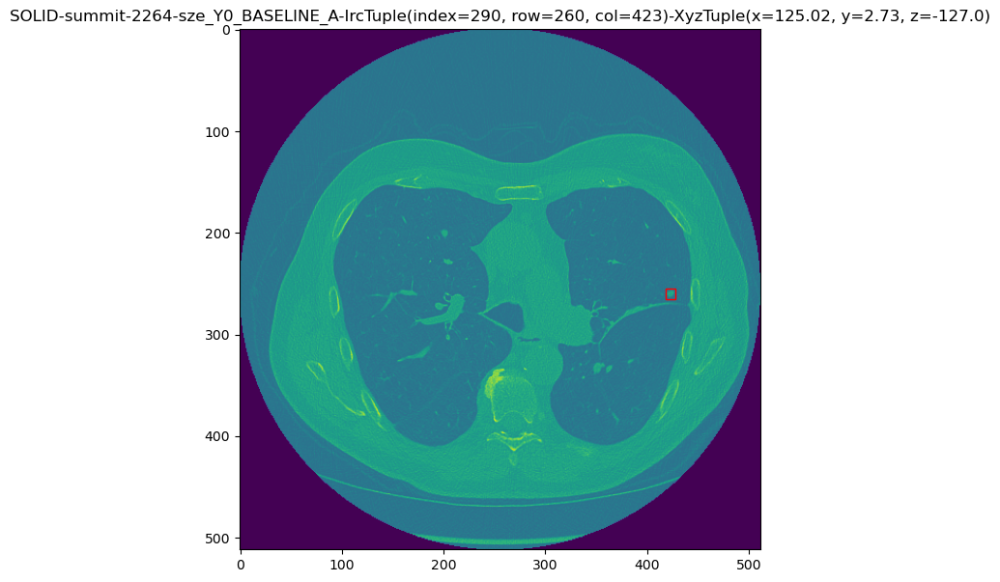

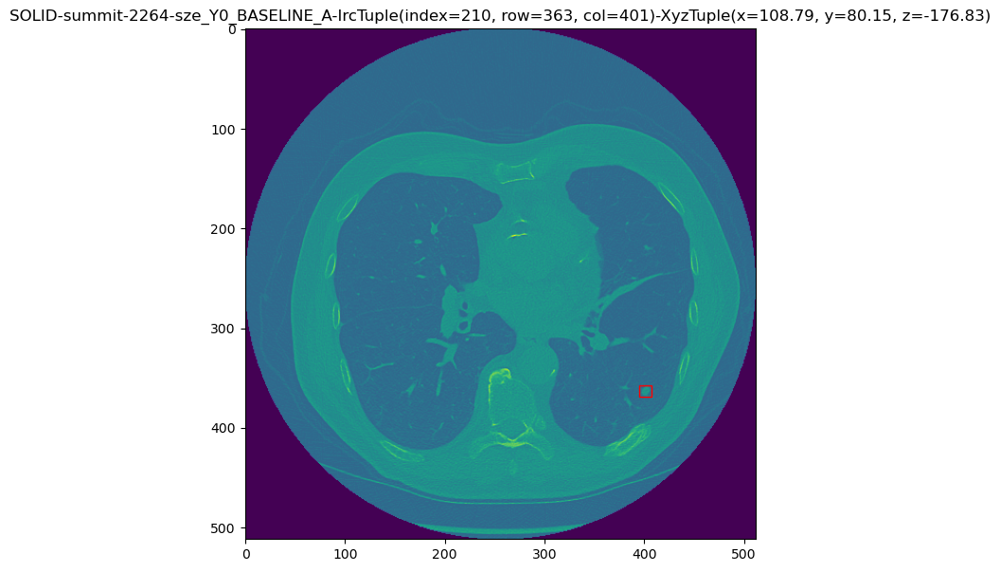

In [75]:
scan = SummitScan.load_scan(path='/Users/john/Projects/SOTAEvaluationNoduleDetection/scans/lung50/summit-2264-sze/summit-2264-sze_Y0_BASELINE_A.mhd')
scan.voxel_size, scan.origin


nodule_type_images = []
for idx, row in baseline_nodule_data_saved[baseline_nodule_data_saved.main_participant_id=='summit-2264-sze'].iterrows():
    nodule_xyz = XyzTuple(x=row['nodule_x_coordinate'],
                            y=row['nodule_y_coordinate'],
                            z=row['nodule_z_coordinate'])

    nodule_irc = xyz2irc(coord_xyz=nodule_xyz,
                            origin=scan.origin,
                            voxel_size=scan.voxel_size,
                            orientation=scan.orientation)

    nodule_diameter = row['nodule_diameter_mm'] if row['nodule_diameter_mm'] else row['nodule_subsolid_major_axis_diameter']
    
    nodule_type_images.append(DisplayTuple(nodule_type=nodule_type,
                                scan_id=scan_id,
                                image=scan.image,
                                xyz_coords=nodule_xyz,
                                irc_coords=nodule_irc,
                                diameter=int(nodule_diameter //scan.voxel_size[1]) ))

display_images(nodule_type_images)
